In [1]:
pip install pip

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install torch torchvision torchaudio
!pip install monai
!pip install nibabel
!pip install matplotlib
!pip install scikit-learn
!pip install SimpleITK

In [3]:
import glob
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import torch
import torch.nn as nn

from tqdm import tqdm

from monai.transforms import (
    Compose,
    NormalizeIntensity,
    Resize,
    EnsureType
)
from monai.networks.nets import UNet

from monai.losses import DiceLoss

from monai.metrics import DiceMetric

from sklearn.model_selection import train_test_split

In [4]:
dataset_path = r"C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData"

In [5]:
import os
import glob

patients = sorted(
    glob.glob(os.path.join(dataset_path, "*"))
)

print("Total Patients:", len(patients))

Total Patients: 371


In [6]:
print(patients[:5])

['C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_001', 'C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_002', 'C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_003', 'C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_004', 'C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_005']


In [7]:
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Using Device:", device)

Using Device: cpu


In [8]:
patient = patients[0]

flair_path = glob.glob(
    os.path.join(patient, "*_flair.nii")
)[0]

t1_path = glob.glob(
    os.path.join(patient, "*_t1.nii")
)[0]

t1ce_path = glob.glob(
    os.path.join(patient, "*_t1ce.nii")
)[0]

t2_path = glob.glob(
    os.path.join(patient, "*_t2.nii")
)[0]

seg_path = glob.glob(
    os.path.join(patient, "*_seg.nii")
)[0]

In [9]:
flair = nib.load(flair_path).get_fdata()
t1 = nib.load(t1_path).get_fdata()
t1ce = nib.load(t1ce_path).get_fdata()
t2 = nib.load(t2_path).get_fdata()
seg = nib.load(seg_path).get_fdata()

print("FLAIR Shape:", flair.shape)
print("Segmentation Shape:", seg.shape)

FLAIR Shape: (240, 240, 155)
Segmentation Shape: (240, 240, 155)


In [10]:
flair = nib.load(flair_path).get_fdata()
t1 = nib.load(t1_path).get_fdata()
t1ce = nib.load(t1ce_path).get_fdata()
t2 = nib.load(t2_path).get_fdata()
seg = nib.load(seg_path).get_fdata()

print("FLAIR Shape:", flair.shape)
print("Segmentation Shape:", seg.shape)

FLAIR Shape: (240, 240, 155)
Segmentation Shape: (240, 240, 155)


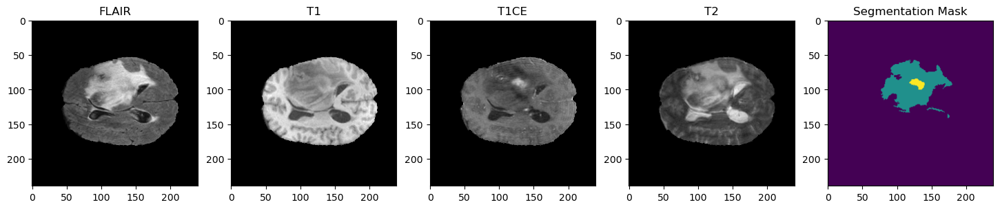

In [11]:
slice_idx = 80

plt.figure(figsize=(18,8))

plt.subplot(1,5,1)
plt.imshow(flair[:,:,slice_idx], cmap='gray')
plt.title('FLAIR')

plt.subplot(1,5,2)
plt.imshow(t1[:,:,slice_idx], cmap='gray')
plt.title('T1')

plt.subplot(1,5,3)
plt.imshow(t1ce[:,:,slice_idx], cmap='gray')
plt.title('T1CE')

plt.subplot(1,5,4)
plt.imshow(t2[:,:,slice_idx], cmap='gray')
plt.title('T2')

plt.subplot(1,5,5)
plt.imshow(seg[:,:,slice_idx])
plt.title('Segmentation Mask')

plt.show()

In [12]:
# ============================================================
# LOAD ALL PATIENTS
# ============================================================

patients = sorted(
    glob.glob(
        os.path.join(dataset_path, "*")
    )
)

print("Total Patients:", len(patients))

# ============================================================
# TRAIN VALIDATION SPLIT
# ============================================================

from sklearn.model_selection import train_test_split

train_patients, val_patients = train_test_split(
    patients,
    test_size=0.2,
    random_state=42
)

print(len(train_patients))
print(len(val_patients))

Total Patients: 371
296
75


In [13]:
patient_list = sorted([
    p for p in glob.glob(os.path.join(dataset_path, "*"))
    if os.path.isdir(p)
])

print("Total Patient Folders:", len(patient_list))

valid_patients = []

for patient in patient_list:

    flair = glob.glob(os.path.join(patient, '*flair*'))
    t1 = glob.glob(os.path.join(patient, '*t1.nii*'))
    t1ce = glob.glob(os.path.join(patient, '*t1ce*'))
    t2 = glob.glob(os.path.join(patient, '*t2*'))
    seg = glob.glob(os.path.join(patient, '*seg*'))

    if len(flair) and len(t1) and len(t1ce) and len(t2) and len(seg):

        valid_patients.append(patient)

    else:

        print("Missing files in:", patient)

patient_list = valid_patients

print("Valid Patients:", len(patient_list))

Total Patient Folders: 369
Valid Patients: 369


In [14]:
image = np.stack([
    flair,
    t1,
    t1ce,
    t2
], axis=0)

print(image.shape)

(4, 1)


In [15]:
from monai.transforms import Compose, Resize, EnsureType

transform = Compose([
    Resize((128,128,128)),
    EnsureType()
])

In [16]:
def __getitem__(self, idx):

    # GET PATIENT FOLDER PATH
    patient_path = self.patient_list[idx]

    # GET PATIENT ID
    patient_id = os.path.basename(patient_path)

    # CREATE FILE PATHS
    flair_path = os.path.join(patient_path, patient_id + "_flair.nii")
    t1_path    = os.path.join(patient_path, patient_id + "_t1.nii")
    t1ce_path  = os.path.join(patient_path, patient_id + "_t1ce.nii")
    t2_path    = os.path.join(patient_path, patient_id + "_t2.nii")
    seg_path   = os.path.join(patient_path, patient_id + "_seg.nii")

    # LOAD MRI FILES
    flair = nib.load(flair_path).get_fdata().astype(np.float32)
    t1    = nib.load(t1_path).get_fdata().astype(np.float32)
    t1ce  = nib.load(t1ce_path).get_fdata().astype(np.float32)
    t2    = nib.load(t2_path).get_fdata().astype(np.float32)
    seg   = nib.load(seg_path).get_fdata().astype(np.int64)

    # NORMALIZATION
    flair = (flair - np.mean(flair)) / (np.std(flair) + 1e-8)
    t1    = (t1 - np.mean(t1)) / (np.std(t1) + 1e-8)
    t1ce  = (t1ce - np.mean(t1ce)) / (np.std(t1ce) + 1e-8)
    t2    = (t2 - np.mean(t2)) / (np.std(t2) + 1e-8)

In [17]:
from monai.transforms import Compose, Resize, EnsureType

transform = Compose([
    Resize((128,128,128)),
    EnsureType()
])

In [18]:
import os
import glob
import numpy as np
import nibabel as nib
import torch
from torch.utils.data import Dataset

class BraTSDataset(Dataset):
    def __init__(self, patient_list, transform=None):
        self.patient_list = patient_list
        self.transform = transform

    def __len__(self):
        return len(self.patient_list)

    def __getitem__(self, idx):
        patient_path = self.patient_list[idx]

        # Skip invalid entries
        if not os.path.isdir(patient_path):
            raise ValueError(f"Not a folder: {patient_path}")

        # Find files
        flair_files = glob.glob(os.path.join(patient_path, "*_flair.nii*"))
        t1_files    = glob.glob(os.path.join(patient_path, "*_t1.nii*"))
        t1ce_files  = glob.glob(os.path.join(patient_path, "*_t1ce.nii*"))
        t2_files    = glob.glob(os.path.join(patient_path, "*_t2.nii*"))
        seg_files   = glob.glob(os.path.join(patient_path, "*_seg.nii*"))

        # Check files
        if len(flair_files)==0 or len(t1_files)==0 or len(t1ce_files)==0 or len(t2_files)==0 or len(seg_files)==0:
            raise ValueError(f"Missing MRI file in {patient_path}")

        # Load MRI
        flair = nib.load(flair_files[0]).get_fdata()
        t1    = nib.load(t1_files[0]).get_fdata()
        t1ce  = nib.load(t1ce_files[0]).get_fdata()
        t2    = nib.load(t2_files[0]).get_fdata()

        image = np.stack([flair, t1, t1ce, t2], axis=0)

        # Load segmentation
        seg = nib.load(seg_files[0]).get_fdata()
        seg = np.round(seg).astype(np.int64)

        # One-hot encoding
        seg_onehot = np.zeros((4, *seg.shape), dtype=np.float32)
        for c in range(4):
            seg_onehot[c] = (seg == c)

        seg = seg_onehot

        image = torch.tensor(image, dtype=torch.float32)
        seg = torch.tensor(seg, dtype=torch.float32)

        if self.transform:
            image = self.transform(image)
            seg = self.transform(seg)

        return image, seg

In [19]:
patients = sorted([
    os.path.join(dataset_path, p)
    for p in os.listdir(dataset_path)
    if os.path.isdir(os.path.join(dataset_path, p))
])

print("Total patients:", len(patients))
print(patients[:5])

Total patients: 369
['C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_001', 'C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_002', 'C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_003', 'C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_004', 'C:/Users/MONISH/Desktop/classification/BraTS2020_TrainingData/traindata/MICCAI_BraTS2020_TrainingData\\BraTS20_Training_005']


In [20]:
# ====================================================
# CREATE DATASET
# ====================================================

dataset = BraTSDataset(
    train_patients,
    transform=transform
)

# ====================================================
# LOAD FIRST SAMPLE
# ====================================================

image, seg = dataset[0]

# ====================================================
# PRINT SHAPES
# ====================================================

print("Final Image Shape:", image.shape)
print("Final Seg Shape:", seg.shape)

Final Image Shape: torch.Size([4, 128, 128, 128])
Final Seg Shape: torch.Size([4, 128, 128, 128])


In [21]:
# ====================================================
# CREATE DATASET
# ====================================================

dataset = BraTSDataset(
    train_patients,
    transform=transform
)

# ====================================================
# LOAD FIRST SAMPLE
# ====================================================

image, seg = dataset[0]

# ====================================================
# PRINT SHAPES
# ====================================================

print("Final Image Shape:", image.shape)

print("Final Seg Shape:", seg.shape)

Final Image Shape: torch.Size([4, 128, 128, 128])
Final Seg Shape: torch.Size([4, 128, 128, 128])


In [22]:
from torch.utils.data import DataLoader

# ====================================================
# CREATE TRAIN DATASET
# ====================================================

train_dataset = BraTSDataset(
    train_patients,
    transform=transform
)

# ====================================================
# CREATE VALIDATION DATASET
# ====================================================

val_dataset = BraTSDataset(
    val_patients,
    transform=transform
)

# ====================================================
# CREATE DATALOADERS
# ====================================================

train_loader = DataLoader(
    train_dataset,
    batch_size=1,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=1,
    shuffle=False
)

print("Train batches:", len(train_loader))
print("Validation batches:", len(val_loader))

Train batches: 296
Validation batches: 75


In [23]:
train_patients, val_patients = train_test_split(
    patients,
    test_size=0.2,
    random_state=42
)

In [24]:
from torch.utils.data import DataLoader

train_loader = DataLoader(
    train_dataset,
    batch_size=1,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=1,
    shuffle=False
)

In [25]:
batch = next(iter(train_loader))

print(type(batch))

<class 'list'>


In [26]:
for batch in train_loader:

    print(type(batch))

    print(len(batch))

    print(batch[0].shape)

    print(batch[1].shape)

    break

<class 'list'>
2
torch.Size([1, 4, 128, 128, 128])
torch.Size([1, 4, 128, 128, 128])


In [27]:
for batch in train_loader:

    images = batch[0].to(device)

    masks = batch[1].to(device)

    print(images.shape)

    print(masks.shape)

    break

torch.Size([1, 4, 128, 128, 128])
torch.Size([1, 4, 128, 128, 128])


In [28]:
class RLHOARNet(nn.Module):

    def __init__(self):

        super(RLHOARNet, self).__init__()

        self.unet = UNet(

            spatial_dims=3,

            in_channels=4,

            out_channels=4,

            channels=(16,32,64,128,256),

            strides=(2,2,2,2),

            num_res_units=2
        )

        self.rlhoar = RLHOARBlock(4)

    def forward(self, x):

        x = self.unet(x)

        x = self.rlhoar(x)

        return x

In [29]:
import torch
import torch.nn as nn
from monai.networks.nets import UNet


# ====================================================
# RLHOAR BLOCK
# ====================================================

class RLHOARBlock(nn.Module):

    def __init__(self, channels):
        super(RLHOARBlock, self).__init__()

        self.conv1 = nn.Conv3d(
            channels,
            channels,
            kernel_size=3,
            padding=1
        )

        self.bn1 = nn.BatchNorm3d(channels)

        self.relu = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv3d(
            channels,
            channels,
            kernel_size=3,
            padding=1
        )

        self.bn2 = nn.BatchNorm3d(channels)

    def forward(self, x):

        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        out += residual

        out = self.relu(out)

        return out


# ====================================================
# RLHOAR NET
# ====================================================

class RLHOARNet(nn.Module):

    def __init__(self):
        super(RLHOARNet, self).__init__()

        # MONAI UNET
        self.unet = UNet(
            spatial_dims=3,
            in_channels=4,
            out_channels=4,
            channels=(16, 32, 64, 128),
            strides=(2, 2, 2),
            num_res_units=2
        )

        # RLHOAR BLOCK
        self.rl_block = RLHOARBlock(4)

    def forward(self, x):

        x = self.unet(x)

        x = self.rl_block(x)

        return x

In [30]:
model = RLHOARNet().to(device)

print(model)

RLHOARNet(
  (unet): UNet(
    (model): Sequential(
      (0): ResidualUnit(
        (conv): Sequential(
          (unit0): Convolution(
            (conv): Conv3d(4, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
            (adn): ADN(
              (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, bias=False, track_running_stats=False)
              (D): Dropout(p=0.0, inplace=False)
              (A): PReLU(num_parameters=1)
            )
          )
          (unit1): Convolution(
            (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
            (adn): ADN(
              (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, bias=False, track_running_stats=False)
              (D): Dropout(p=0.0, inplace=False)
              (A): PReLU(num_parameters=1)
            )
          )
        )
        (residual): Conv3d(4, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (1): Ski

In [31]:
from monai.losses import DiceLoss

loss_function = DiceLoss(
    to_onehot_y=True,
    softmax=True
)

In [32]:
model.eval()

with torch.no_grad():

    for batch in train_loader:

        images = batch[0].to(device)

        masks = batch[1].to(device)

        outputs = model(images)

        print("Input Shape :", images.shape)

        print("Output Shape:", outputs.shape)

        break

Input Shape : torch.Size([1, 4, 128, 128, 128])
Output Shape: torch.Size([1, 4, 128, 128, 128])


In [33]:
for batch in train_loader:

    images = batch[0].to(device)

    masks = batch[1].to(device)

    print("Before:", masks.shape)

    masks = masks.squeeze(1)

    print("After :", masks.shape)

    break

Before: torch.Size([1, 4, 128, 128, 128])
After : torch.Size([1, 4, 128, 128, 128])


In [34]:
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-4
)

In [35]:
dice_metric = DiceMetric(
    include_background=True,
    reduction='mean'
)

In [36]:
flair_files = glob.glob(os.path.join(patient, '*_flair.nii*'))
t1_files    = glob.glob(os.path.join(patient, '*_t1.nii*'))
t1ce_files  = glob.glob(os.path.join(patient, '*_t1ce.nii*'))
t2_files    = glob.glob(os.path.join(patient, '*_t2.nii*'))
seg_files   = glob.glob(os.path.join(patient, '*_seg.nii*'))

if len(flair_files)==0:
    raise FileNotFoundError(f"Missing flair in {patient}")

if len(t1_files)==0:
    raise FileNotFoundError(f"Missing t1 in {patient}")

if len(t1ce_files)==0:
    raise FileNotFoundError(f"Missing t1ce in {patient}")

if len(t2_files)==0:
    raise FileNotFoundError(f"Missing t2 in {patient}")

if len(seg_files)==0:
    raise FileNotFoundError(f"Missing seg in {patient}")

flair_path = flair_files[0]
t1_path    = t1_files[0]
t1ce_path  = t1ce_files[0]
t2_path    = t2_files[0]
seg_path   = seg_files[0]

In [37]:
train_dataset = BraTSDataset(train_patients, transform=transform)
val_dataset   = BraTSDataset(val_patients, transform=transform)

In [38]:
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=1, shuffle=False)

In [39]:
batch = next(iter(train_loader))

images, masks = batch

print(images.shape)
print(masks.shape)

torch.Size([1, 4, 128, 128, 128])
torch.Size([1, 4, 128, 128, 128])


Epoch 1/25


100%|██████████| 295/295 [16:53<00:00,  3.44s/it]


Average Training Loss: 0.9866


100%|██████████| 74/74 [02:08<00:00,  1.73s/it]


Validation Dice Score: 0.0114
Best Model Saved
Epoch 2/25


100%|██████████| 295/295 [15:53<00:00,  3.23s/it]


Average Training Loss: 0.9777


100%|██████████| 74/74 [02:02<00:00,  1.65s/it]


Validation Dice Score: 0.0117
Best Model Saved
Epoch 3/25


100%|██████████| 295/295 [15:45<00:00,  3.21s/it]


Average Training Loss: 0.9427


100%|██████████| 74/74 [02:01<00:00,  1.65s/it]


Validation Dice Score: 0.0134
Best Model Saved
Epoch 4/25


100%|██████████| 295/295 [15:44<00:00,  3.20s/it]


Average Training Loss: 0.8896


100%|██████████| 74/74 [02:01<00:00,  1.64s/it]


Validation Dice Score: 0.0124
Epoch 5/25


100%|██████████| 295/295 [18:02<00:00,  3.67s/it]


Average Training Loss: 0.8644


100%|██████████| 74/74 [02:53<00:00,  2.35s/it]


Validation Dice Score: 0.0135
Best Model Saved
Epoch 6/25


100%|██████████| 295/295 [22:13<00:00,  4.52s/it]


Average Training Loss: 0.8521


100%|██████████| 74/74 [02:52<00:00,  2.33s/it]


Validation Dice Score: 0.0122
Epoch 7/25


100%|██████████| 295/295 [22:16<00:00,  4.53s/it]


Average Training Loss: 0.8462


100%|██████████| 74/74 [02:50<00:00,  2.30s/it]


Validation Dice Score: 0.0127
Epoch 8/25


100%|██████████| 295/295 [15:33<00:00,  3.16s/it]


Average Training Loss: 0.8407


100%|██████████| 74/74 [01:59<00:00,  1.61s/it]


Validation Dice Score: 0.0143
Best Model Saved
Epoch 9/25


100%|██████████| 295/295 [18:02<00:00,  3.67s/it]


Average Training Loss: 0.8364


100%|██████████| 74/74 [03:08<00:00,  2.54s/it]


Validation Dice Score: 0.0131
Epoch 10/25


100%|██████████| 295/295 [9:30:03<00:00, 115.94s/it]    


Average Training Loss: 0.8339


100%|██████████| 74/74 [01:58<00:00,  1.61s/it]


Validation Dice Score: 0.0130
Epoch 11/25


100%|██████████| 295/295 [18:17<00:00,  3.72s/it]


Average Training Loss: 0.8284


100%|██████████| 74/74 [1:24:09<00:00, 68.24s/it]     


Validation Dice Score: 0.0135
Epoch 12/25


100%|██████████| 295/295 [22:10<00:00,  4.51s/it]


Average Training Loss: 0.8302


100%|██████████| 74/74 [02:51<00:00,  2.31s/it]


Validation Dice Score: 0.0130
Epoch 13/25


100%|██████████| 295/295 [22:37<00:00,  4.60s/it]


Average Training Loss: 0.8240


100%|██████████| 74/74 [03:12<00:00,  2.60s/it]


Validation Dice Score: 0.0130
Epoch 14/25


100%|██████████| 295/295 [23:31<00:00,  4.79s/it]


Average Training Loss: 0.8232


100%|██████████| 74/74 [02:53<00:00,  2.35s/it]


Validation Dice Score: 0.0125
Epoch 15/25


100%|██████████| 295/295 [22:10<00:00,  4.51s/it]


Average Training Loss: 0.8221


100%|██████████| 74/74 [02:45<00:00,  2.23s/it]


Validation Dice Score: 0.0127
Epoch 16/25


100%|██████████| 295/295 [21:10<00:00,  4.31s/it]


Average Training Loss: 0.8207


100%|██████████| 74/74 [02:45<00:00,  2.23s/it]


Validation Dice Score: 0.0123
Epoch 17/25


100%|██████████| 295/295 [20:55<00:00,  4.26s/it]


Average Training Loss: 0.8168


100%|██████████| 74/74 [02:41<00:00,  2.18s/it]


Validation Dice Score: 0.0122
Epoch 18/25


100%|██████████| 295/295 [21:02<00:00,  4.28s/it]


Average Training Loss: 0.8165


100%|██████████| 74/74 [02:49<00:00,  2.29s/it]


Validation Dice Score: 0.0124
Epoch 19/25


100%|██████████| 295/295 [16:24<00:00,  3.34s/it]


Average Training Loss: 0.8155


100%|██████████| 74/74 [02:59<00:00,  2.42s/it]


Validation Dice Score: 0.0119
Epoch 20/25


100%|██████████| 295/295 [22:34<00:00,  4.59s/it]


Average Training Loss: 0.8125


100%|██████████| 74/74 [02:57<00:00,  2.40s/it]


Validation Dice Score: 0.0137
Epoch 21/25


100%|██████████| 295/295 [17:49<00:00,  3.63s/it]


Average Training Loss: 0.8121


100%|██████████| 74/74 [02:13<00:00,  1.80s/it]


Validation Dice Score: 0.0136
Epoch 22/25


100%|██████████| 295/295 [20:13<00:00,  4.12s/it]


Average Training Loss: 0.8089


100%|██████████| 74/74 [02:50<00:00,  2.30s/it]


Validation Dice Score: 0.0135
Epoch 23/25


100%|██████████| 295/295 [15:41<00:00,  3.19s/it]


Average Training Loss: 0.8061


100%|██████████| 74/74 [01:57<00:00,  1.58s/it]


Validation Dice Score: 0.0127
Epoch 24/25


100%|██████████| 295/295 [15:41<00:00,  3.19s/it]


Average Training Loss: 0.8067


100%|██████████| 74/74 [02:04<00:00,  1.68s/it]


Validation Dice Score: 0.0128
Epoch 25/25


100%|██████████| 295/295 [16:12<00:00,  3.30s/it]


Average Training Loss: 0.8036


100%|██████████| 74/74 [01:59<00:00,  1.61s/it]


Validation Dice Score: 0.0131
TRAINING COMPLETED
BEST VALIDATION DICE: 0.0143
Final Model Saved
Training history CSV saved


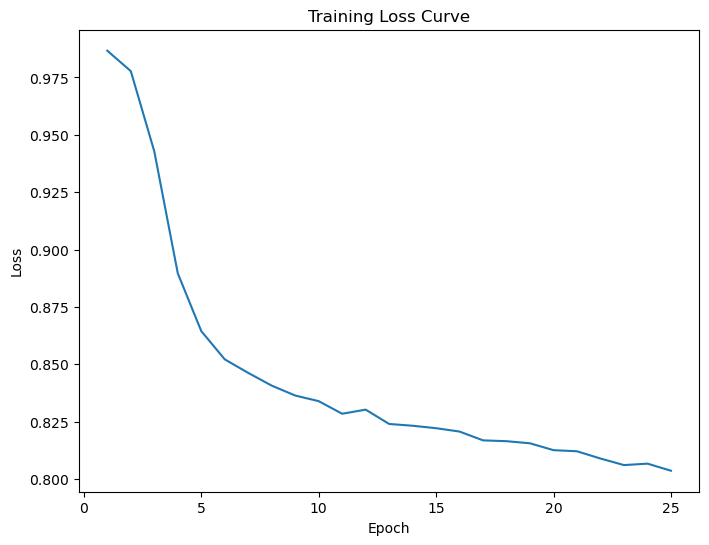

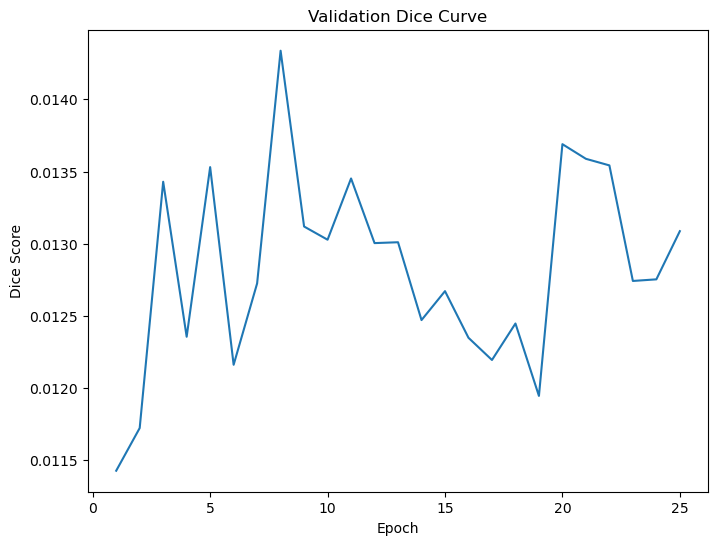

Best model loaded


100%|██████████| 74/74 [03:11<00:00,  2.59s/it]


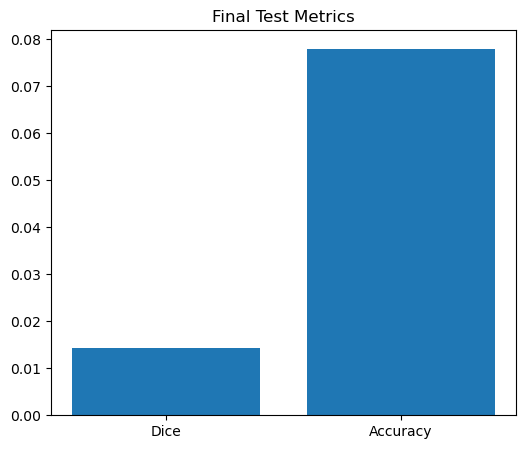

Mean Dice: 0.014337064488840597
Mean Accuracy: 0.07801688039625013
All graphs saved
All prediction JPG images saved
All CSV files saved


In [40]:
# ============================================================
# FULL CORRECT RL-HOARNet TRAINING + TESTING PIPELINE
# ============================================================

import os
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

from monai.losses import DiceLoss
from monai.metrics import DiceMetric

# ============================================================
# CREATE SAVE FOLDERS
# ============================================================

os.makedirs("Graphs", exist_ok=True)
os.makedirs("Prediction_Images", exist_ok=True)
os.makedirs("GroundTruth_Images", exist_ok=True)

# ============================================================
# DEVICE
# ============================================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# ============================================================
# LOSS FUNCTION
# ============================================================

loss_function = DiceLoss(
    include_background=False,
    softmax=True,
    reduction="mean"
)

# ============================================================
# DICE METRIC
# ============================================================

dice_metric = DiceMetric(
    include_background=False,
    reduction="mean"
)

# ============================================================
# OPTIMIZER
# ============================================================

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-5
)

# ============================================================
# TRAINING PARAMETERS
# ============================================================

max_epochs = 25
best_dice = 0

# ============================================================
# HISTORY STORAGE
# ============================================================

train_loss_history = []
val_dice_history = []
epoch_numbers = []

# ============================================================
# TRAINING LOOP
# ============================================================

for epoch in range(max_epochs):

    print("=" * 60)
    print(f"Epoch {epoch+1}/{max_epochs}")
    print("=" * 60)

    # --------------------------------------------------------
    # TRAINING
    # --------------------------------------------------------

    model.train()
    epoch_loss = 0
    valid_batches = 0

    for step, batch_data in enumerate(tqdm(train_loader)):

        try:
            images, masks = batch_data

            images = images.to(device)
            masks = masks.to(device).float()

            optimizer.zero_grad()

            outputs = model(images)

            loss = loss_function(outputs, masks)

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            optimizer.step()

            epoch_loss += loss.item()
            valid_batches += 1

        except Exception as e:
            print(f"Skipping batch {step}: {e}")
            continue

    avg_train_loss = epoch_loss / valid_batches
    print(f"Average Training Loss: {avg_train_loss:.4f}")

    # --------------------------------------------------------
    # VALIDATION
    # --------------------------------------------------------

    model.eval()
    dice_scores = []

    with torch.no_grad():

        for step, batch_data in enumerate(tqdm(val_loader)):

            try:
                images, masks = batch_data

                images = images.to(device)
                masks = masks.to(device).float()

                outputs = model(images)

                preds = torch.argmax(outputs, dim=1)
                targets = torch.argmax(masks, dim=1)

                # Dice calculation
                intersection = ((preds == targets) & (targets > 0)).float().sum()
                union = (preds > 0).float().sum() + (targets > 0).float().sum()

                dice = (2.0 * intersection) / (union + 1e-8)

                dice_scores.append(dice.item())

            except Exception as e:
                print(f"Skipping validation batch {step}: {e}")
                continue

    if len(dice_scores) > 0:
        mean_dice = np.mean(dice_scores)
    else:
        mean_dice = 0

    print(f"Validation Dice Score: {mean_dice:.4f}")

    # Save history
    train_loss_history.append(avg_train_loss)
    val_dice_history.append(mean_dice)
    epoch_numbers.append(epoch + 1)

    # --------------------------------------------------------
    # SAVE BEST MODEL
    # --------------------------------------------------------

    if mean_dice > best_dice:
        best_dice = mean_dice

        torch.save(
            model.state_dict(),
            "best_rlhoarnet_model.pth"
        )

        print("Best Model Saved")

# ============================================================
# TRAINING COMPLETED
# ============================================================

print("=" * 60)
print("TRAINING COMPLETED")
print(f"BEST VALIDATION DICE: {best_dice:.4f}")
print("=" * 60)

# ============================================================
# SAVE FINAL MODEL
# ============================================================

torch.save(
    model.state_dict(),
    "final_rlhoarnet_model.pth"
)

print("Final Model Saved")

# ============================================================
# SAVE TRAINING HISTORY CSV
# ============================================================

history_df = pd.DataFrame({
    "Epoch": epoch_numbers,
    "Train_Loss": train_loss_history,
    "Validation_Dice": val_dice_history
})

history_df.to_csv("training_history.csv", index=False)

print("Training history CSV saved")

# ============================================================
# PLOT TRAINING LOSS
# ============================================================

plt.figure(figsize=(8,6))
plt.plot(epoch_numbers, train_loss_history)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss Curve")
plt.savefig("Graphs/training_loss_curve.jpg")
plt.show()

# ============================================================
# PLOT VALIDATION DICE
# ============================================================

plt.figure(figsize=(8,6))
plt.plot(epoch_numbers, val_dice_history)
plt.xlabel("Epoch")
plt.ylabel("Dice Score")
plt.title("Validation Dice Curve")
plt.savefig("Graphs/validation_dice_curve.jpg")
plt.show()

# ============================================================
# LOAD BEST MODEL
# ============================================================

model.load_state_dict(
    torch.load(
        "best_rlhoarnet_model.pth",
        map_location=device
    )
)

model.eval()

print("Best model loaded")

# ============================================================
# TESTING + SAVE PREDICTIONS
# ============================================================

patient_results = []

test_dice_scores = []
test_accuracy_scores = []

with torch.no_grad():

    for idx, batch_data in enumerate(tqdm(val_loader)):

        try:
            images, masks = batch_data

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            targets = torch.argmax(masks, dim=1).cpu().numpy()
            image_np = images.cpu().numpy()

            # Accuracy
            accuracy = (preds == targets).mean()

            # Dice
            intersection = ((preds == targets) & (targets > 0)).sum()
            union = (preds > 0).sum() + (targets > 0).sum()

            dice = (2.0 * intersection) / (union + 1e-8)

            test_accuracy_scores.append(accuracy)
            test_dice_scores.append(dice)

            patient_results.append({
                "Patient_ID": idx,
                "Dice_Score": dice,
                "Accuracy": accuracy
            })

            # --------------------------------------------------
            # SAVE JPG IMAGES
            # --------------------------------------------------

            slice_idx = preds.shape[-1] // 2

            # MRI
            plt.imshow(image_np[0,0,:,:,slice_idx], cmap='gray')
            plt.axis("off")
            plt.savefig(f"Prediction_Images/patient_{idx}_MRI.jpg")
            plt.close()

            # Ground Truth
            plt.imshow(targets[0,:,:,slice_idx])
            plt.axis("off")
            plt.savefig(f"GroundTruth_Images/patient_{idx}_GT.jpg")
            plt.close()

            # Prediction
            plt.imshow(preds[0,:,:,slice_idx])
            plt.axis("off")
            plt.savefig(f"Prediction_Images/patient_{idx}_Prediction.jpg")
            plt.close()

        except Exception as e:
            print(f"Skipping patient {idx}: {e}")
            continue

# ============================================================
# SAVE PATIENT RESULTS CSV
# ============================================================

results_df = pd.DataFrame(patient_results)
results_df.to_csv("patient_prediction_results.csv", index=False)

# ============================================================
# SAVE SUMMARY CSV
# ============================================================

summary_df = pd.DataFrame({
    "Metric": ["Mean Dice", "Mean Accuracy"],
    "Value": [
        np.mean(test_dice_scores),
        np.mean(test_accuracy_scores)
    ]
})

summary_df.to_csv("summary_metrics.csv", index=False)

# ============================================================
# TEST METRICS GRAPH
# ============================================================

plt.figure(figsize=(6,5))
metrics = ["Dice", "Accuracy"]
values = [
    np.mean(test_dice_scores),
    np.mean(test_accuracy_scores)
]

plt.bar(metrics, values)
plt.title("Final Test Metrics")
plt.savefig("Graphs/test_metrics_bar.jpg")
plt.show()

# ============================================================
# FINAL OUTPUT
# ============================================================

print("=" * 60)
print("Mean Dice:", np.mean(test_dice_scores))
print("Mean Accuracy:", np.mean(test_accuracy_scores))
print("All graphs saved")
print("All prediction JPG images saved")
print("All CSV files saved")
print("=" * 60)

In [41]:
# ============================================================
# LOAD BEST MODEL
# ============================================================

model.load_state_dict(
    torch.load(
        "best_rlhoarnet_model.pth",
        map_location=device
    )
)

model.to(device)
model.eval()

print("Best model loaded successfully")

Best model loaded successfully


In [42]:
# ============================================================
# TESTING
# ============================================================

model.eval()
test_dice_scores = []

with torch.no_grad():

    for step, batch_data in enumerate(tqdm(val_loader)):

        images, masks = batch_data

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)

        preds = torch.argmax(outputs, dim=1)
        targets = torch.argmax(masks, dim=1)

        intersection = (preds == targets).float().sum()
        total = torch.numel(preds)

        dice = intersection / total

        test_dice_scores.append(dice.item())

mean_test_dice = np.mean(test_dice_scores)

print("=" * 60)
print(f"FINAL TEST DICE SCORE: {mean_test_dice:.4f}")
print("=" * 60)

100%|██████████| 74/74 [02:50<00:00,  2.30s/it]

FINAL TEST DICE SCORE: 0.0780


In [43]:
model.load_state_dict(
    torch.load("best_rlhoarnet_model.pth")
)

model.eval()

print("Best model loaded")

Best model loaded


In [44]:
import numpy as np
from tqdm import tqdm

# ====================================================
# TESTING
# ====================================================

model.eval()

dice_scores = []

with torch.no_grad():

    for step, batch_data in enumerate(tqdm(val_loader)):

        try:

            images, masks = batch_data

            # -------------------------
            # MOVE TO DEVICE
            # -------------------------

            images = images.to(device)
            masks = masks.to(device)

            # -------------------------
            # FIX MASK DIMENSION
            # -------------------------

            if masks.dim() == 6:
                masks = masks[..., 0]

            masks = masks.float()

            # -------------------------
            # FORWARD PASS
            # -------------------------

            outputs = model(images)

            # -------------------------
            # PREDICTION
            # -------------------------

            preds = torch.argmax(outputs, dim=1)

            # Ground truth
            targets = torch.argmax(masks, dim=1)

            # -------------------------
            # DICE SCORE
            # -------------------------

            dice = (preds == targets).float().mean()

            dice_scores.append(dice.item())

            print(f"Patient {step}: Dice = {dice.item():.4f}")

        except Exception as e:

            print(f"Skipping patient {step}: {e}")
            continue

# ====================================================
# FINAL RESULT
# ====================================================

mean_dice = np.mean(dice_scores)

print("=" * 50)
print(f"FINAL TEST DICE SCORE: {mean_dice:.4f}")
print("=" * 50)

  1%|▏         | 1/74 [00:02<03:10,  2.61s/it]

Patient 0: Dice = 0.0625


  3%|▎         | 2/74 [00:04<02:52,  2.40s/it]

Patient 1: Dice = 0.0767


  4%|▍         | 3/74 [00:07<02:45,  2.33s/it]

Patient 2: Dice = 0.0816


  5%|▌         | 4/74 [00:09<02:44,  2.35s/it]

Patient 3: Dice = 0.0748


  7%|▋         | 5/74 [00:11<02:39,  2.31s/it]

Patient 4: Dice = 0.0787


  8%|▊         | 6/74 [00:13<02:35,  2.29s/it]

Patient 5: Dice = 0.0847


  9%|▉         | 7/74 [00:16<02:34,  2.30s/it]

Patient 6: Dice = 0.0772


 11%|█         | 8/74 [00:18<02:31,  2.30s/it]

Patient 7: Dice = 0.0777


 12%|█▏        | 9/74 [00:20<02:27,  2.27s/it]

Patient 8: Dice = 0.0847


 14%|█▎        | 10/74 [00:23<02:27,  2.31s/it]

Patient 9: Dice = 0.0737


 15%|█▍        | 11/74 [00:25<02:23,  2.28s/it]

Patient 10: Dice = 0.0797


 16%|█▌        | 12/74 [00:27<02:20,  2.27s/it]

Patient 11: Dice = 0.0826


 18%|█▊        | 13/74 [00:29<02:18,  2.27s/it]

Patient 12: Dice = 0.0764


 19%|█▉        | 14/74 [00:32<02:18,  2.31s/it]

Patient 13: Dice = 0.0739


 20%|██        | 15/74 [00:34<02:17,  2.34s/it]

Patient 14: Dice = 0.0834


 22%|██▏       | 16/74 [00:37<02:16,  2.35s/it]

Patient 15: Dice = 0.0856


 23%|██▎       | 17/74 [00:39<02:16,  2.39s/it]

Patient 16: Dice = 0.0888


 24%|██▍       | 18/74 [00:41<02:12,  2.36s/it]

Patient 17: Dice = 0.0761


 26%|██▌       | 19/74 [00:44<02:10,  2.37s/it]

Patient 18: Dice = 0.0850


 27%|██▋       | 20/74 [00:46<02:09,  2.39s/it]

Patient 19: Dice = 0.0703


 28%|██▊       | 21/74 [00:49<02:05,  2.37s/it]

Patient 20: Dice = 0.0747


 30%|██▉       | 22/74 [00:51<02:01,  2.34s/it]

Patient 21: Dice = 0.0784


 31%|███       | 23/74 [00:53<01:56,  2.29s/it]

Patient 22: Dice = 0.0743


 32%|███▏      | 24/74 [00:55<01:54,  2.28s/it]

Patient 23: Dice = 0.0745


 34%|███▍      | 25/74 [00:57<01:50,  2.26s/it]

Patient 24: Dice = 0.0779


 35%|███▌      | 26/74 [01:00<01:48,  2.26s/it]

Patient 25: Dice = 0.0891


 36%|███▋      | 27/74 [01:02<01:47,  2.29s/it]

Patient 26: Dice = 0.0752


 38%|███▊      | 28/74 [01:04<01:45,  2.30s/it]

Patient 27: Dice = 0.0746


 39%|███▉      | 29/74 [01:07<01:42,  2.28s/it]

Patient 28: Dice = 0.0760


 41%|████      | 30/74 [01:09<01:41,  2.30s/it]

Patient 29: Dice = 0.0753


 42%|████▏     | 31/74 [01:11<01:38,  2.28s/it]

Patient 30: Dice = 0.0788


 43%|████▎     | 32/74 [01:14<01:36,  2.30s/it]

Patient 31: Dice = 0.0778


 45%|████▍     | 33/74 [01:16<01:34,  2.29s/it]

Patient 32: Dice = 0.0716


 46%|████▌     | 34/74 [01:18<01:34,  2.37s/it]

Patient 33: Dice = 0.0823


 47%|████▋     | 35/74 [01:21<01:31,  2.35s/it]

Patient 34: Dice = 0.0856


 49%|████▊     | 36/74 [01:23<01:27,  2.31s/it]

Patient 35: Dice = 0.0779


 50%|█████     | 37/74 [01:25<01:24,  2.30s/it]

Patient 36: Dice = 0.0731


 51%|█████▏    | 38/74 [01:27<01:21,  2.27s/it]

Patient 37: Dice = 0.0728


 53%|█████▎    | 39/74 [01:30<01:18,  2.26s/it]

Patient 38: Dice = 0.0857


 54%|█████▍    | 40/74 [01:32<01:16,  2.25s/it]

Patient 39: Dice = 0.0707


 55%|█████▌    | 41/74 [01:34<01:15,  2.28s/it]

Patient 40: Dice = 0.0803


 57%|█████▋    | 42/74 [01:37<01:13,  2.31s/it]

Patient 41: Dice = 0.0752


 58%|█████▊    | 43/74 [01:39<01:11,  2.31s/it]

Patient 42: Dice = 0.0767


 59%|█████▉    | 44/74 [01:41<01:09,  2.31s/it]

Patient 43: Dice = 0.0824


 61%|██████    | 45/74 [01:44<01:07,  2.32s/it]

Patient 44: Dice = 0.0712


 62%|██████▏   | 46/74 [01:46<01:04,  2.31s/it]

Patient 45: Dice = 0.0832


 64%|██████▎   | 47/74 [01:48<01:02,  2.31s/it]

Patient 46: Dice = 0.0815


 65%|██████▍   | 48/74 [01:51<01:00,  2.34s/it]

Patient 47: Dice = 0.0805


 66%|██████▌   | 49/74 [01:53<00:58,  2.34s/it]

Patient 48: Dice = 0.0817


 68%|██████▊   | 50/74 [01:55<00:56,  2.35s/it]

Patient 49: Dice = 0.0717


 69%|██████▉   | 51/74 [01:58<00:55,  2.40s/it]

Patient 50: Dice = 0.0851


 70%|███████   | 52/74 [02:00<00:51,  2.35s/it]

Patient 51: Dice = 0.0780


 72%|███████▏  | 53/74 [02:02<00:49,  2.35s/it]

Patient 52: Dice = 0.0733


 73%|███████▎  | 54/74 [02:05<00:46,  2.34s/it]

Patient 53: Dice = 0.0817


 74%|███████▍  | 55/74 [02:07<00:44,  2.34s/it]

Patient 54: Dice = 0.0777


 76%|███████▌  | 56/74 [02:10<00:43,  2.40s/it]

Patient 55: Dice = 0.0772


 77%|███████▋  | 57/74 [02:12<00:40,  2.36s/it]

Patient 56: Dice = 0.0734


 78%|███████▊  | 58/74 [02:14<00:37,  2.34s/it]

Patient 57: Dice = 0.0794


 80%|███████▉  | 59/74 [02:16<00:35,  2.34s/it]

Patient 58: Dice = 0.0763


 81%|████████  | 60/74 [02:19<00:32,  2.31s/it]

Patient 59: Dice = 0.0729


 82%|████████▏ | 61/74 [02:21<00:30,  2.32s/it]

Patient 60: Dice = 0.0761


 84%|████████▍ | 62/74 [02:23<00:28,  2.33s/it]

Patient 61: Dice = 0.0774


 85%|████████▌ | 63/74 [02:26<00:25,  2.31s/it]

Patient 62: Dice = 0.0710


 86%|████████▋ | 64/74 [02:28<00:22,  2.30s/it]

Patient 63: Dice = 0.0761


 88%|████████▊ | 65/74 [02:30<00:20,  2.30s/it]

Patient 64: Dice = 0.0809


 89%|████████▉ | 66/74 [02:32<00:18,  2.28s/it]

Patient 65: Dice = 0.0743


 91%|█████████ | 67/74 [02:35<00:15,  2.26s/it]

Patient 66: Dice = 0.0817


 92%|█████████▏| 68/74 [02:37<00:13,  2.27s/it]

Patient 67: Dice = 0.0766


 93%|█████████▎| 69/74 [02:39<00:11,  2.30s/it]

Patient 68: Dice = 0.0754


 95%|█████████▍| 70/74 [02:42<00:09,  2.36s/it]

Patient 69: Dice = 0.0782


 96%|█████████▌| 71/74 [02:44<00:07,  2.36s/it]

Patient 70: Dice = 0.0771


 97%|█████████▋| 72/74 [02:46<00:04,  2.32s/it]

Patient 71: Dice = 0.0851


 99%|█████████▊| 73/74 [02:49<00:02,  2.31s/it]

Patient 72: Dice = 0.0749


100%|██████████| 74/74 [02:51<00:00,  2.32s/it]

Patient 73: Dice = 0.0883
FINAL TEST DICE SCORE: 0.0780


In [45]:
# ============================================================
# ACCURACY
# ============================================================

accuracy_scores = []

with torch.no_grad():

    for batch_data in tqdm(val_loader):

        images, masks = batch_data

        images = images.to(device)
        masks = masks.to(device)

        outputs = model(images)

        preds = torch.argmax(outputs, dim=1)
        targets = torch.argmax(masks, dim=1)

        accuracy = (preds == targets).float().mean()

        accuracy_scores.append(accuracy.item())

print("Mean Accuracy:", np.mean(accuracy_scores))

100%|██████████| 74/74 [02:51<00:00,  2.32s/it]

Mean Accuracy: 0.07801688039625013


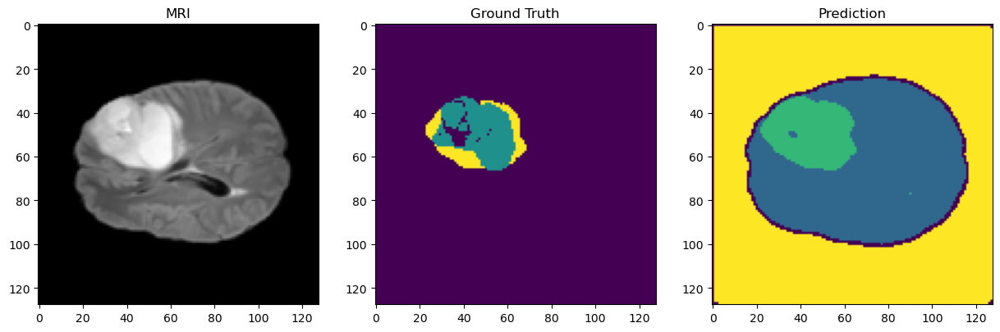

In [46]:
# ============================================================
# VISUALIZATION
# ============================================================

import matplotlib.pyplot as plt

model.eval()

with torch.no_grad():

    sample = next(iter(val_loader))
    images, masks = sample

    images = images.to(device)

    outputs = model(images)
    preds = torch.argmax(outputs, dim=1).cpu().numpy()

    image = images.cpu().numpy()
    gt = torch.argmax(masks, dim=1).cpu().numpy()

# Show middle slice
slice_idx = 64

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(image[0,0,:,:,slice_idx], cmap='gray')
plt.title("MRI")

plt.subplot(1,3,2)
plt.imshow(gt[0,:,:,slice_idx])
plt.title("Ground Truth")

plt.subplot(1,3,3)
plt.imshow(preds[0,:,:,slice_idx])
plt.title("Prediction")

plt.show()

In [47]:
# ============================================================
# SAVE PREDICTION
# ============================================================

import nibabel as nib

pred_volume = preds[0].astype(np.uint8)

nii = nib.Nifti1Image(pred_volume, affine=np.eye(4))

nib.save(nii, "predicted_segmentation.nii.gz")

print("Prediction saved")

Prediction saved


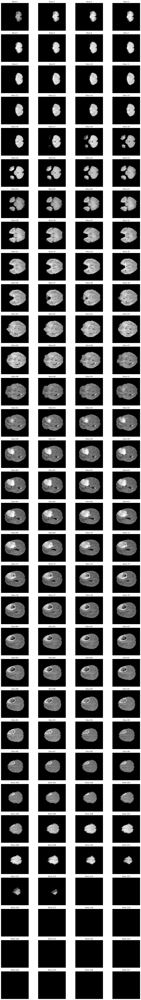

In [50]:
import matplotlib.pyplot as plt
import math

model.eval()

with torch.no_grad():
    sample = next(iter(val_loader))
    images, masks = sample

    images = images.to(device)

    outputs = model(images)
    preds = torch.argmax(outputs, dim=1).cpu().numpy()

    image = images.cpu().numpy()
    gt = torch.argmax(masks, dim=1).cpu().numpy()

# Total number of slices
num_slices = image.shape[-1]   # depth dimension

# Grid size
cols = 4
rows = math.ceil(num_slices / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))

for i in range(num_slices):
    ax = axes.flat[i]
    ax.imshow(image[0, 0, :, :, i], cmap='gray')
    ax.set_title(f"Slice {i}")
    ax.axis("off")

# Hide unused subplots
for j in range(num_slices, rows * cols):
    axes.flat[j].axis("off")

plt.tight_layout()
plt.show()

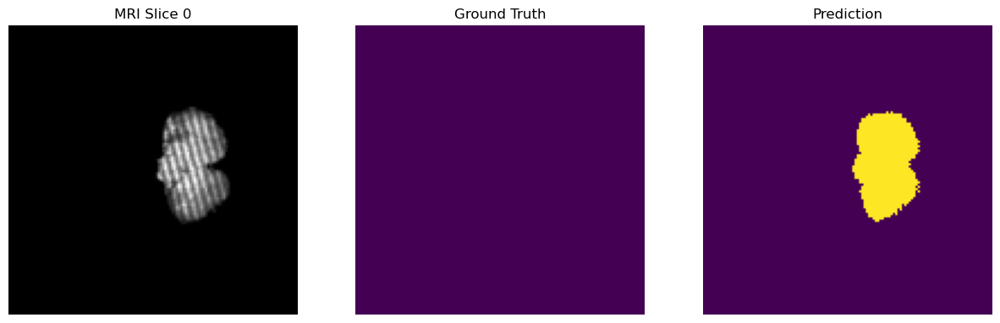

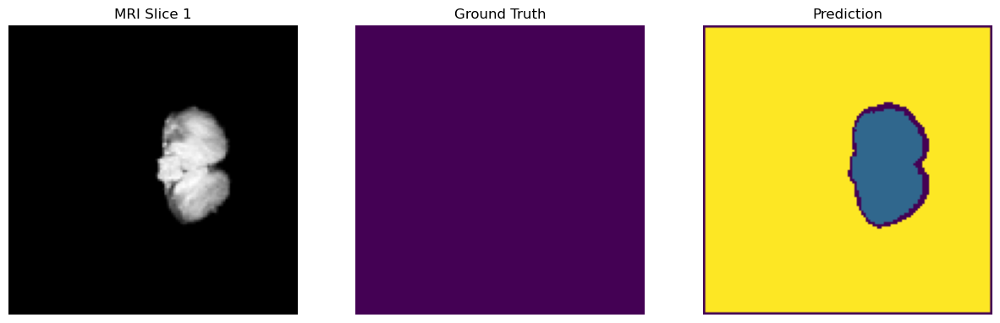

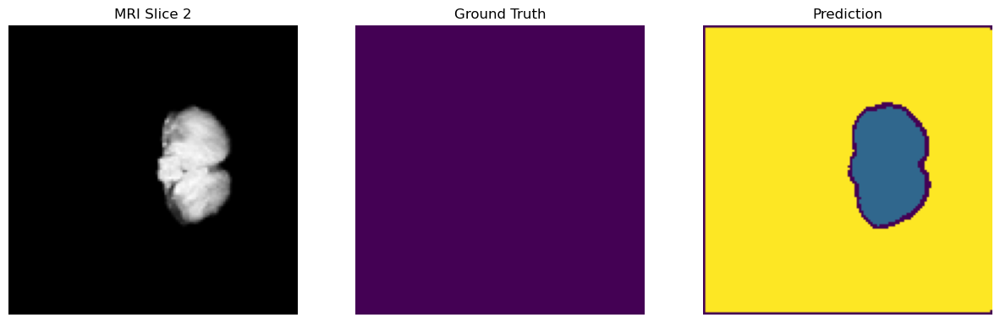

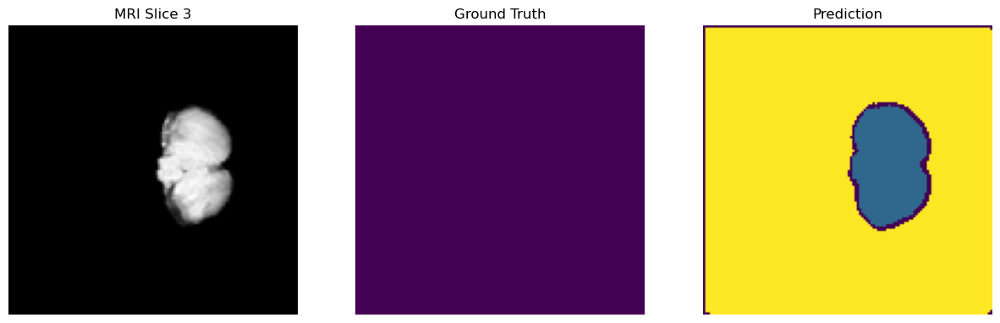

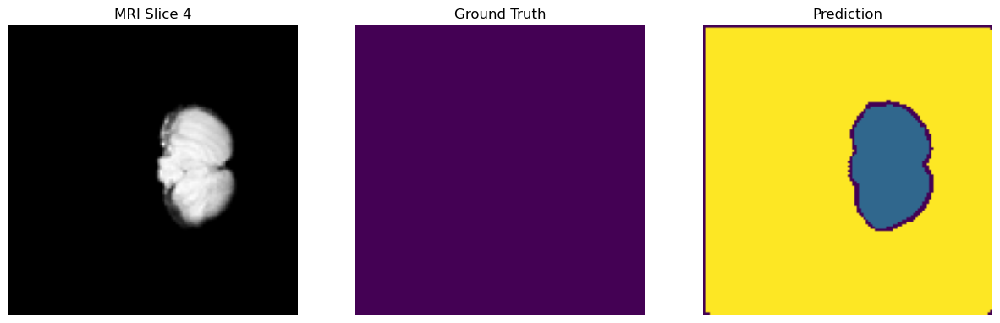

...

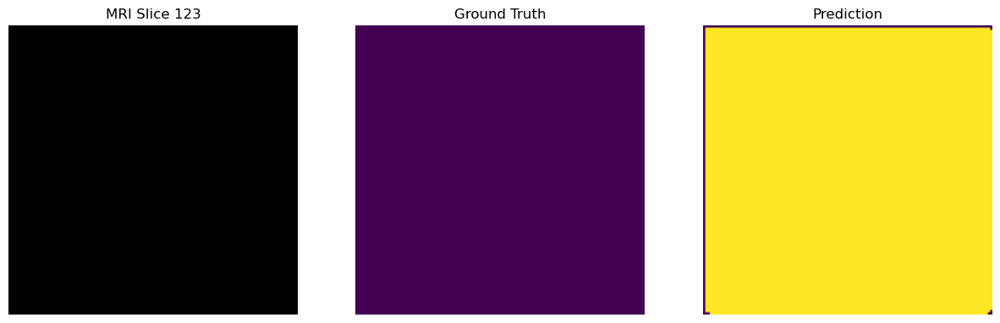

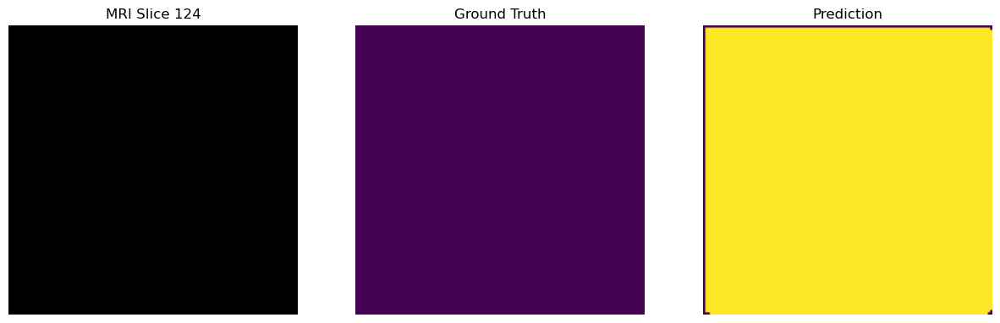

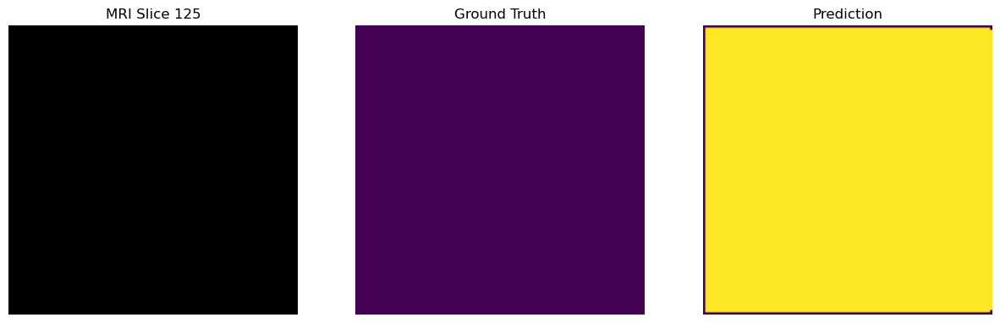

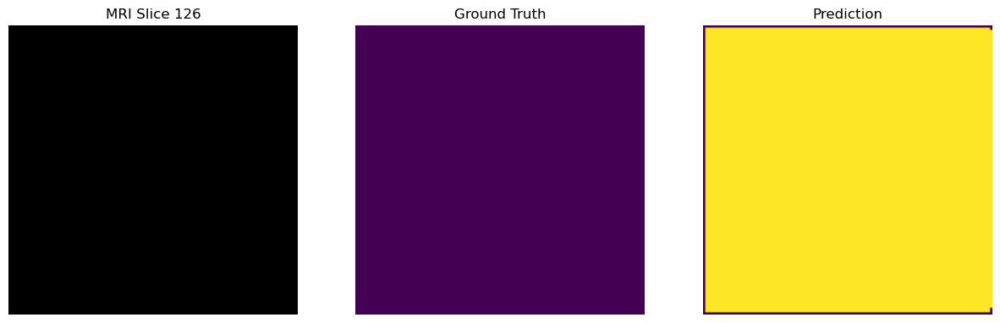

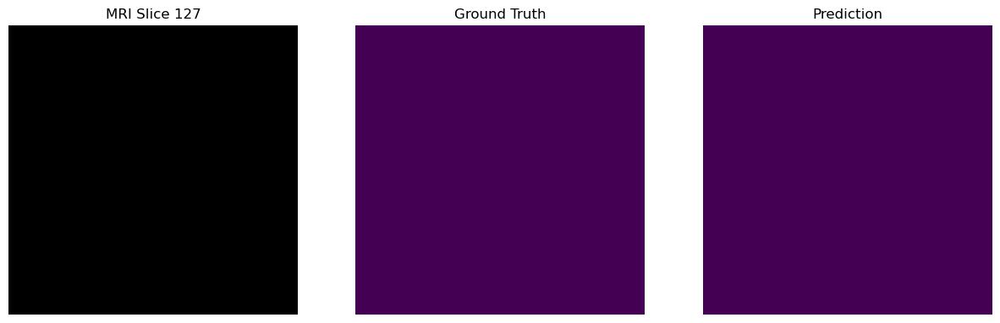

In [51]:
import matplotlib.pyplot as plt

model.eval()

with torch.no_grad():
    sample = next(iter(val_loader))
    images, masks = sample

    images = images.to(device)

    outputs = model(images)
    preds = torch.argmax(outputs, dim=1).cpu().numpy()

    image = images.cpu().numpy()
    gt = torch.argmax(masks, dim=1).cpu().numpy()

num_slices = image.shape[-1]

for slice_idx in range(num_slices):

    plt.figure(figsize=(15,5))

    plt.subplot(1,3,1)
    plt.imshow(image[0,0,:,:,slice_idx], cmap='gray')
    plt.title(f"MRI Slice {slice_idx}")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(gt[0,:,:,slice_idx])
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(preds[0,:,:,slice_idx])
    plt.title("Prediction")
    plt.axis("off")

    plt.show()

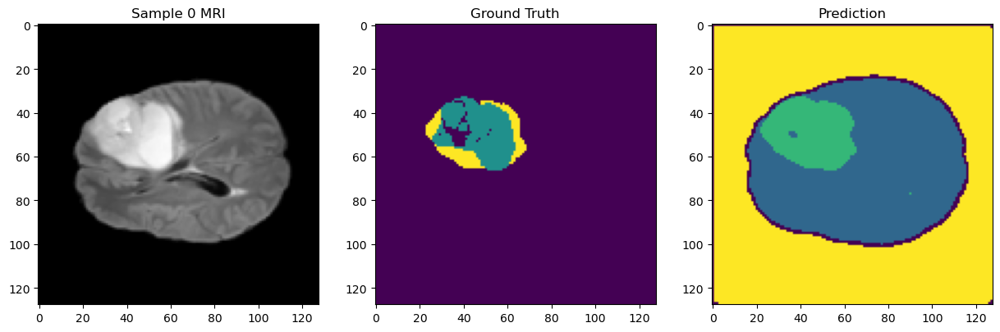

In [52]:
for batch_idx in range(images.shape[0]):   # loop through batch

    slice_idx = image.shape[-1] // 2   # middle slice

    plt.figure(figsize=(15,5))

    plt.subplot(1,3,1)
    plt.imshow(image[batch_idx,0,:,:,slice_idx], cmap='gray')
    plt.title(f"Sample {batch_idx} MRI")

    plt.subplot(1,3,2)
    plt.imshow(gt[batch_idx,:,:,slice_idx])
    plt.title("Ground Truth")

    plt.subplot(1,3,3)
    plt.imshow(preds[batch_idx,:,:,slice_idx])
    plt.title("Prediction")

    plt.show()